In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [44]:
# Function to normalize a channel for better visualization
def normalize_channel(channel):
    return cv2.normalize(channel, None, 0, 255, cv2.NORM_MINMAX)

In [118]:
# Read image
img_bgr = cv2.imread('bowls_1.webp')

#### 1. Color Models (RGB, Grayscale, HSV, HLS, LAB)
##### Images can be represented in different color models:
##### - **RGB**: Uses Red, Green, and Blue channels.
##### - **Grayscale**: Simplifies the image to shades of gray.
##### - **HSV**: Separates image into Hue (color), Saturation (vibrancy), and Value (brightness).
##### - **HLS**: Similar to HSV but splits into Hue, Lightness, and Saturation.
##### - **LAB**: L is Lightness, a is green-red range, b is blue-yellow range. It's more about how humans perceive color.

In [119]:
# Convert image to different color models
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
img_ycr_cv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCR_CB)
img_hls = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HLS)
img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)

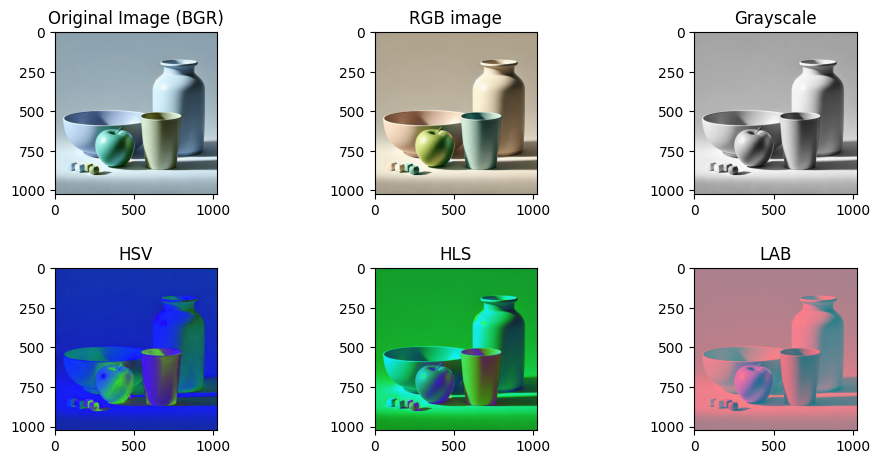

In [27]:
# Show the image

plt.figure(figsize=(10, 5))

plt.subplot(231)
plt.imshow(img_bgr)
plt.title("Original Image (BGR)")

plt.subplot(232)
plt.imshow(img_rgb)
plt.title("RGB image")

# Display Grayscale, HSV, HLS, and LAB images
plt.subplot(233)
plt.imshow(img_gray, cmap='gray')
plt.title("Grayscale")

plt.subplot(234)
plt.imshow(img_hsv)
plt.title("HSV")

plt.subplot(235)
plt.imshow(img_hls)
plt.title("HLS")

plt.subplot(236)
plt.imshow(img_lab)
plt.title("LAB")

plt.tight_layout(pad=2.0)
plt.show()

#### 2. Extract Individual Channels
##### Each color model has separate channels that hold different information about the image.
##### For RGB: Red, Green, Blue. For HSV: Hue, Saturation, Value. For LAB: Lightness, a, b.

### Extract channels from RGB

Text(0.5, 1.0, 'Blue Channel (RGB)')

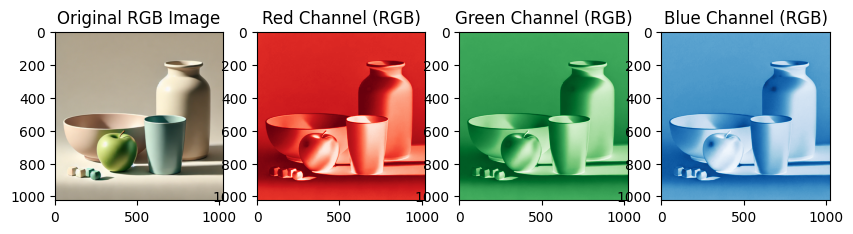

In [64]:
r_channel, g_channel, b_channel = img_rgb[:, :, 0], img_rgb[:, :, 1], img_rgb[:, :, 2]

plt.figure(figsize=(10, 8))

plt.subplot(241)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(242)
plt.imshow(r_channel, cmap='Reds')
plt.title("Red Channel (RGB)")

plt.subplot(243)
plt.imshow(g_channel, cmap='Greens')
plt.title("Green Channel (RGB)")

plt.subplot(244)
plt.imshow(b_channel, cmap='Blues')
plt.title("Blue Channel (RGB)")

### Extract channels from HSV
- Hue: Use a circular colormap that represents color, like hsv (which cycles through the hues).
- Saturation: Use a colormap representing intensity, like Greens.
- Value: Use grayscale (gray) as it's a measure of brightness

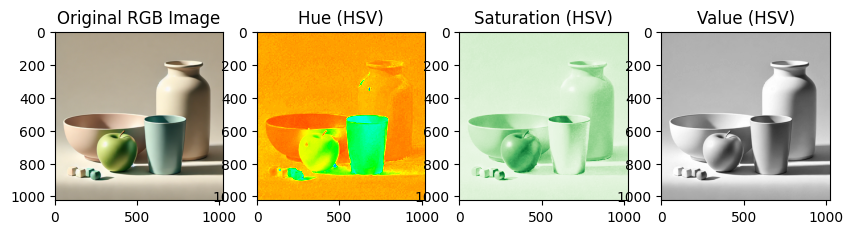

In [66]:
h_channel, s_channel, v_channel = cv2.split(img_hsv)

plt.figure(figsize=(10, 8))

plt.subplot(241)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(242)
plt.imshow(h_channel, cmap='hsv')
plt.title("Hue (HSV)")

plt.subplot(243)
plt.imshow(s_channel, cmap='Greens')
plt.title("Saturation (HSV)")

plt.subplot(244)
plt.imshow(v_channel, cmap='gray')
plt.title("Value (HSV)")

plt.show()

### Extract channels from LAB
- Lightness (L): Use grayscale (gray).
- a component (green to red): Use a colormap that transitions from green to magenta (e.g., PiYG).
- b component (blue to yellow): Use a colormap that transitions from blue to yellow (e.g., coolwarm).

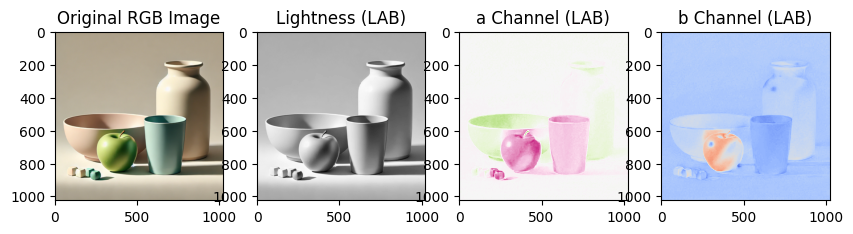

In [67]:
l_channel_lab, a_channel_lab, b_channel_lab = cv2.split(img_lab)

l_channel_normalized = normalize_channel(l_channel_lab)
a_channel_normalized = normalize_channel(a_channel_lab)
b_channel_normalized = normalize_channel(b_channel_lab)

plt.figure(figsize=(10, 8))

plt.subplot(241)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(242)
plt.imshow(l_channel_lab, cmap='gray')
plt.title("Lightness (LAB)")

plt.subplot(243)
plt.imshow(a_channel_lab, cmap='PiYG')
plt.title("a Channel (LAB)")

plt.subplot(244)
plt.imshow(b_channel_lab, cmap='coolwarm')
plt.title("b Channel (LAB)")

plt.show()

### Extract channels from HLS and normalize

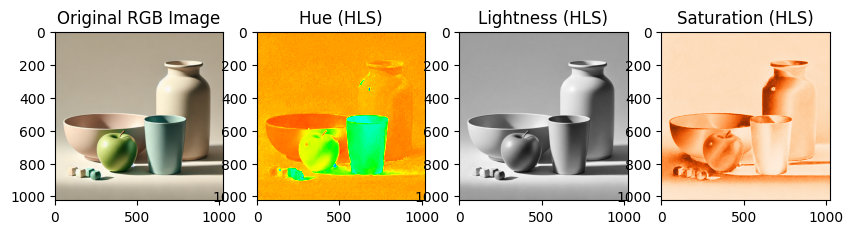

In [68]:
h_channel_hls, l_channel_hls, s_channel_hls = cv2.split(img_hls)
h_channel_normalized = normalize_channel(h_channel_hls)
l_channel_hls_normalized = normalize_channel(l_channel_hls)
s_channel_hls_normalized = normalize_channel(s_channel_hls)

plt.figure(figsize=(10, 8))

plt.subplot(241)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(242)
plt.imshow(h_channel_normalized, cmap='hsv')  # HSV colormap for Hue (HLS)
plt.title("Hue (HLS)")

plt.subplot(243)
plt.imshow(l_channel_hls_normalized, cmap='gray')  # Grayscale for Lightness (HLS)
plt.title("Lightness (HLS)")

plt.subplot(244)
plt.imshow(s_channel_hls_normalized, cmap='Oranges')  # Orangeish for Saturation (HLS)
plt.title("Saturation (HLS)")

plt.show()

##### 3. Thresholding Methods (Basic, Adaptive, Otsu)

Thresholding is a technique used to convert a grayscale image into a binary image (black and white) by setting a threshold value. Pixels below the threshold become black, and those above it become white.

- **Basic Thresholding**: A single global threshold is applied to the whole image. It's simple but may not work well if the image has uneven lighting.
- **Adaptive Thresholding**: The threshold is calculated for smaller regions of the image, which helps in handling varying lighting conditions. There are two types:
  - **Mean Adaptive Thresholding**: The threshold is the mean of the neighborhood pixel values.
  - **Gaussian Adaptive Thresholding**: The threshold is a weighted sum (Gaussian distribution) of neighborhood pixel values.
- **Otsu's Thresholding**: Automatically finds the optimal threshold value based on the image's histogram, making it useful for images with bimodal distributions.

These methods are useful for tasks like image segmentation and preprocessing for object detection.

A bimodal distribution is a type of probability distribution that has two distinct peaks or modes in its frequency or probability curve. 
In simpler terms, it indicates that there are two dominant values or ranges of values where data is concentrated.

In the context of image processing and Otsu's thresholding:

- A bimodal distribution in an image's histogram means that the pixel intensity values can be grouped into two main classes: foreground (e.g., objects of interest) and background (e.g., the rest of the image).
- Otsu's method works best with bimodal histograms because it seeks to find the optimal threshold value that separates the two peaks, effectively distinguishing the object from the background.

In [55]:
# Basic thresholding (global thresholding)
_, thresh_basic = cv2.threshold(img_gray, 128, 255, cv2.THRESH_BINARY)

# Adaptive thresholding (mean and Gaussian)
thresh_adaptive_mean = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
thresh_adaptive_gauss = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Otsu's thresholding
_, thresh_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

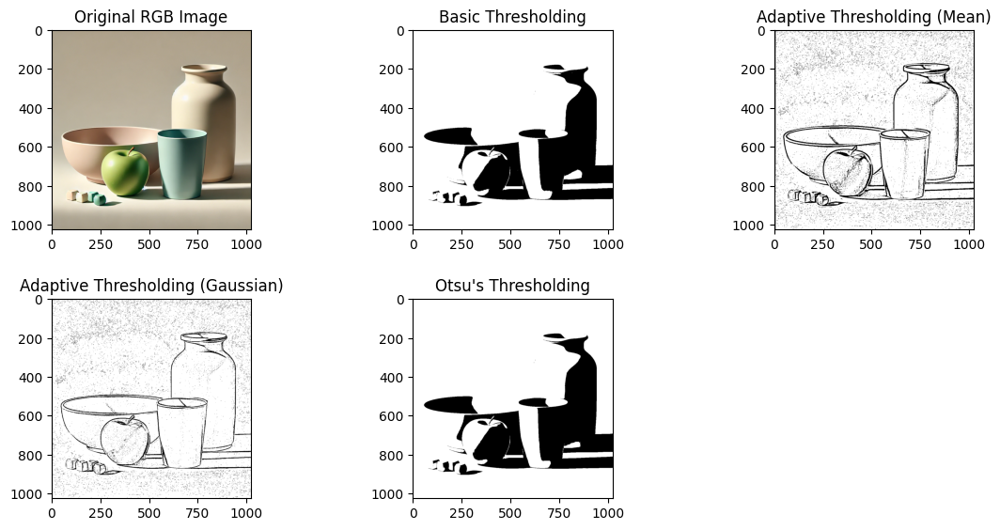

In [71]:
# Plot the results
plt.figure(figsize=(12, 6))

plt.subplot(231)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(232)
plt.imshow(thresh_basic, cmap='gray')
plt.title("Basic Thresholding")

plt.subplot(233)
plt.imshow(thresh_adaptive_mean, cmap='gray')
plt.title("Adaptive Thresholding (Mean)")

plt.subplot(234)
plt.imshow(thresh_adaptive_gauss, cmap='gray')
plt.title("Adaptive Thresholding (Gaussian)")

plt.subplot(235)
plt.imshow(thresh_otsu, cmap='gray')
plt.title("Otsu's Thresholding")

plt.tight_layout(pad=2.0)
plt.show()

# 4. Intensity Transformation - Negative Image

In a negative image, light areas appear dark, and dark areas appear light.

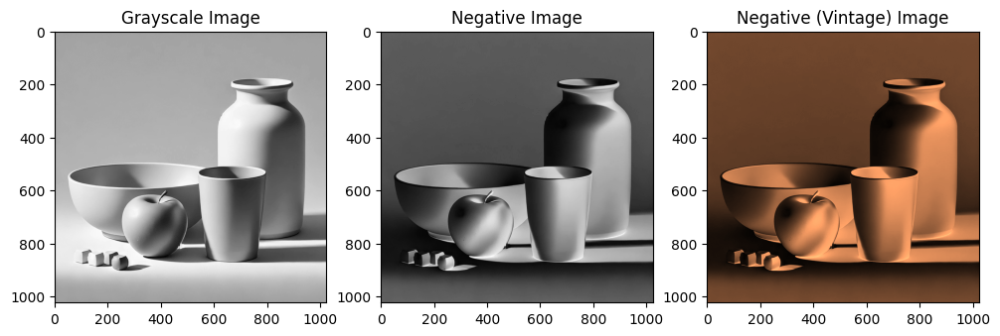

In [77]:
img_negative = 255 - img_gray

plt.figure(figsize=(12, 6))

plt.subplot(131)
plt.imshow(img_gray, cmap='gray')
plt.title("Grayscale Image")

plt.subplot(132)
plt.imshow(img_negative, cmap='gray')
plt.title("Negative Image")

plt.subplot(133)
plt.imshow(img_negative, cmap='copper')
plt.title("Negative (Vintage, copper color pallete) Image")
plt.show()

### 5. **Gamma Correction (Power-Law Transformation)**
### Gamma correction adjusts the brightness of an image.
### A gamma value greater than 1 makes the image darker, while a value less than 1 brightens the image.
### This transformation is often used to adjust the brightness of images in display systems.

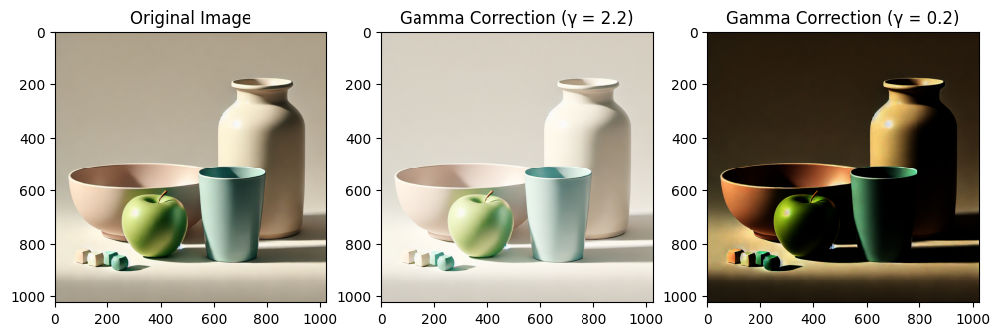

In [94]:
def gamma_correction(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)

gamma_img = gamma_correction(img_rgb, gamma=2.2)
gamma_img_subunitar = gamma_correction(img_rgb, gamma=0.2)

plt.figure(figsize=(12, 6))

plt.subplot(131)
plt.imshow(img_rgb)
plt.title("Original Image")

plt.subplot(132)
plt.imshow(gamma_img)
plt.title("Gamma Correction (γ = 2.2)")

plt.subplot(133)
plt.imshow(gamma_img_subunitar)
plt.title("Gamma Correction (γ = 0.2)")

plt.show()


### 6. **Contrast Enhancement**
### 6.1 Contrast stretching is a simple image enhancement technique.
### It stretches the range of intensity values to span a desired range, typically the full range of the image's possible intensity values (0 to 255).
### This can improve the overall contrast of an image.

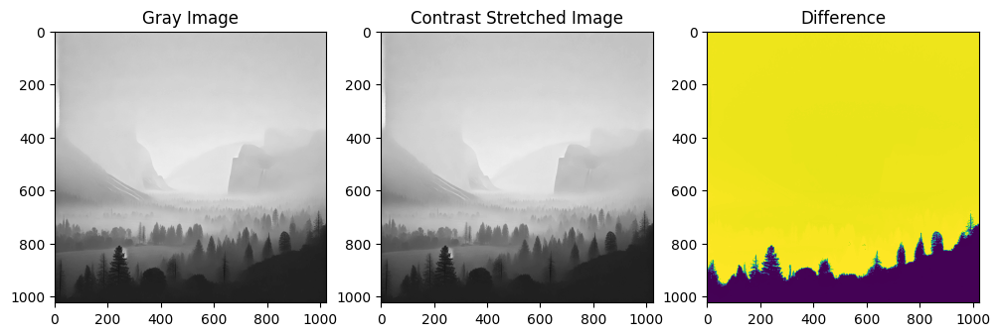

In [116]:
def contrast_stretching_gray_image(image):
    a = np.min(image)
    b = np.max(image)
    stretched = (image - a) * (255 / (b - a))
    return stretched.astype(np.uint8)

img_name = 'foggy1.webp'
img_gray2 = cv2.cvtColor(cv2.imread(img_name), cv2.COLOR_BGR2GRAY)

contrast_stretched_img = contrast_stretching_gray_image(img_gray2)

plt.figure(figsize=(12, 6))

plt.subplot(131)
plt.imshow(img_gray2, cmap='gray')
plt.title("Gray Image")

plt.subplot(132)
plt.imshow(contrast_stretched_img, cmap='gray')
plt.title("Contrast Stretched Image")

plt.subplot(133)
plt.imshow(img_gray2 - contrast_stretched_img)
plt.title("Difference")


plt.show()

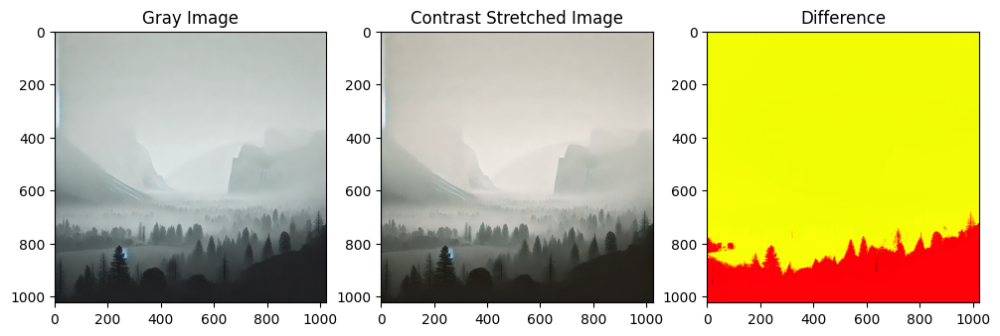

In [162]:
def contrast_stretch_rgb_image(image):
    stretched_image = np.zeros_like(image, dtype=np.uint8)
    
    # Perform contrast stretching for each channel (R, G, B)
    for i in range(3):  # 0=R, 1=G, 2=B
        min_val = np.min(image[:,:,i])
        max_val = np.max(image[:,:,i])
        
        stretched_image[:,:,i] = ((image[:,:,i] - min_val) / (max_val - min_val) * 255).astype(np.uint8)
    
    return stretched_image

img_name = 'foggy1.webp'
img_rgb2 = cv2.cvtColor(cv2.imread(img_name), cv2.COLOR_BGR2RGB)

# Apply contrast stretching to the RGB image
contrast_stretched_image = contrast_stretch_rgb_image(img_rgb2)

plt.figure(figsize=(12, 6))

plt.subplot(131)
plt.imshow(img_rgb2)
plt.title("Gray Image")

plt.subplot(132)
plt.imshow(contrast_stretched_image)
plt.title("Contrast Stretched Image")

plt.subplot(133)
plt.imshow(img_rgb2 - contrast_stretched_image)
plt.title("Difference")

plt.show()

### 6.2 Unsharp Masking
### How it works: Enhances contrast by sharpening the edges in an image. This method improves local contrast and makes features like bones or lesions more visible in medical images.
### Application: Often used in MRI and CT scan images for highlighting edges and fine details.

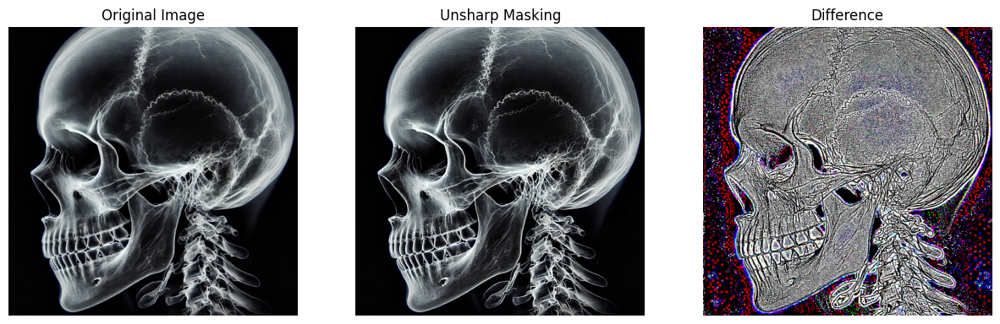

In [197]:
unsharp_masking_image_input = cv2.imread('skull2.jpg')
unsharp_masking_image_input = cv2.cvtColor(unsharp_masking_image_input, cv2.COLOR_BGR2RGB)

# Apply Gaussian Blur
blurred = cv2.GaussianBlur(unsharp_masking_image_input, (9, 9), 10.0)

# Unsharp Mask: original + amount * (original - blurred)
unsharp_image = cv2.addWeighted(unsharp_masking_image_input, 1.5, blurred, -0.5, 0)

# Display the original and unsharp masked image
plt.figure(figsize=(15, 8))
plt.subplot(131)
plt.imshow(unsharp_masking_image_input)
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(unsharp_image)
plt.title('Unsharp Masking')
plt.axis('off')

plt.subplot(133)
plt.imshow(unsharp_image - unsharp_masking_image_input)
plt.title('Difference')
plt.axis('off')

plt.show()

### 6.3 Logarithmic and Exponential Transformations
### How it works: These functions change the contrast by applying non-linear transformations. Logarithmic transformations enhance dark regions, while exponential transformations focus on bright regions.
### Application: These are useful for enhancing specific features of medical images, like highlighting soft tissues or subtle variations in contrast.

### 6.3.1 Logarithmic Transformation

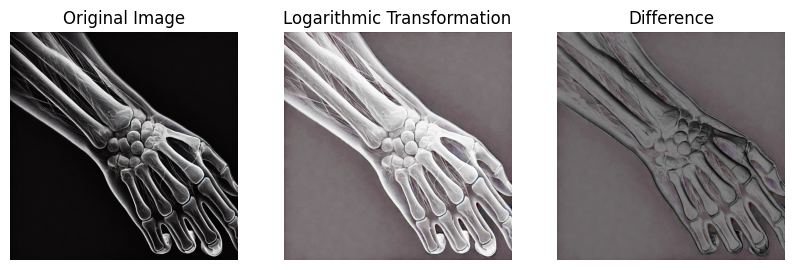

In [200]:
log__exp_image_input = cv2.imread('arm1.jpg')
log__exp_image_input = cv2.cvtColor(log__exp_image_input, cv2.COLOR_BGR2RGB)

# Convert to float32 to avoid overflow and apply logarithmic transformation
image_float = np.float32(log__exp_image_input) + 1  # Add 1 to avoid log(0)
log_image = cv2.log(image_float)

# Normalize the result to the range 0-255
log_image = cv2.normalize(log_image, None, 0, 255, cv2.NORM_MINMAX)
log_image = np.uint8(log_image)

# Display the original and logarithmic-transformed image
plt.figure(figsize=(10, 5))
plt.subplot(131)
plt.imshow(log__exp_image_input)
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(log_image)
plt.title('Logarithmic Transformation')
plt.axis('off')

plt.subplot(133)
plt.imshow(log_image - log__exp_image_input)
plt.title('Difference')
plt.axis('off')


plt.show()

### 6.3.2 Exponential Transformation|

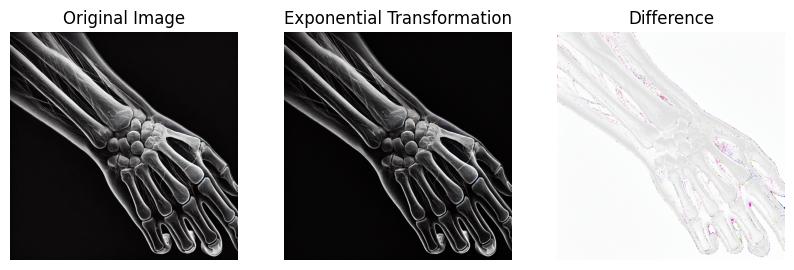

In [201]:
# Apply Exponential Transformation on the RGB image
exp_image = np.exp(image_float / 255) - 1  # Exponential transformation

# Normalize the result to the range 0-255
exp_image = cv2.normalize(exp_image, None, 0, 255, cv2.NORM_MINMAX)
exp_image = np.uint8(exp_image)

# Display the original and exponential-transformed image
plt.figure(figsize=(10, 5))
plt.subplot(131)
plt.imshow(log__exp_image_input)
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(exp_image)
plt.title('Exponential Transformation')
plt.axis('off')

plt.subplot(133)
plt.imshow(exp_image - log__exp_image_input)
plt.title('Difference')
plt.axis('off')


plt.show()

### 6.4 Contrast-Limited Adaptive Histogram Equalization (CLAHE)
### How it works: This method works by applying histogram equalization to small regions in the image (called tiles). It is especially useful in preventing over-amplification of noise.
### Application: Commonly used in medical imaging for localized contrast enhancement, especially in MRI and CT images.

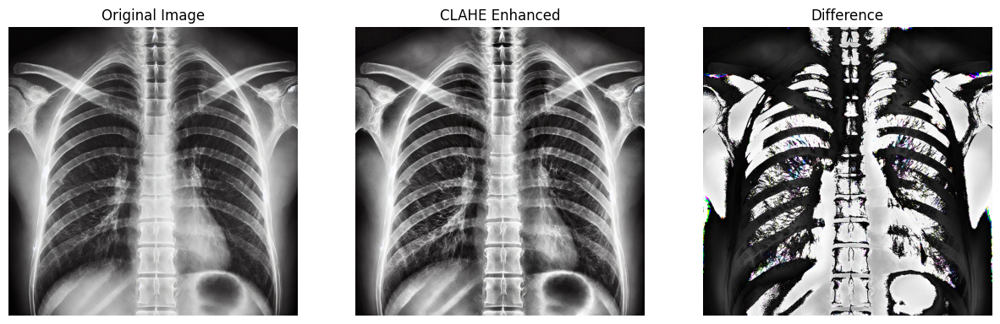

In [193]:
# Apply CLAHE
clahe_image_input = cv2.imread('xray5.jpg')
clahe_image_input = cv2.cvtColor(clahe_image_input, cv2.COLOR_BGR2RGB)

lab_image = cv2.cvtColor(clahe_image_input, cv2.COLOR_BGR2LAB)
L, A, B = cv2.split(lab_image)

clahe = cv2.createCLAHE(clipLimit=2.6, tileGridSize=(8, 8))
L_clahe = clahe.apply(L)

lab_clahe = cv2.merge((L_clahe, A, B))

rgb_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)

# Display results
plt.figure(figsize=(15, 8))
plt.subplot(131)
plt.imshow(clahe_image_input, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(rgb_clahe, cmap='gray')
plt.title('CLAHE Enhanced')
plt.axis('off')

plt.subplot(133)
plt.imshow(rgb_clahe - clahe_image_input)
plt.title('Difference')
plt.axis('off')

plt.show()

### 6.5 Retinex Algorithm
### How it works: Based on how the human eye perceives contrast, the Retinex algorithm enhances local contrast by simulating the way humans adapt to varying lighting conditions.
### Application: It can be used in medical images for improving visibility of structures in low-light or low-contrast scenarios.
### Sigma values of gaussian blur: Lower values (e.g., 15) focus on finer details, while higher values (e.g., 250) focus on larger structures.

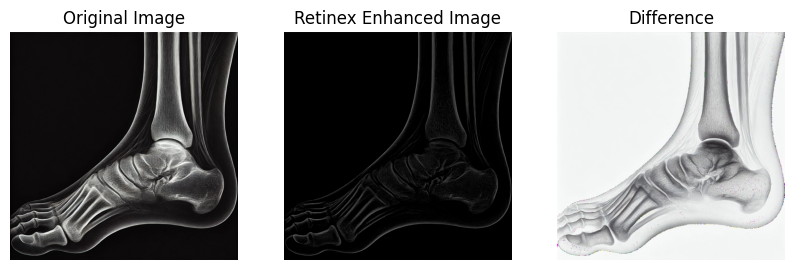

In [194]:
reetinex_image_input = cv2.imread('foot2.jpg')
reetinex_image_input = cv2.cvtColor(reetinex_image_input, cv2.COLOR_BGR2RGB)

# Multi-scale Retinex (MSR)
def retinex(img, sigma_list):
    retinex = np.zeros_like(img)
    for sigma in sigma_list:
        # Apply Gaussian Blur with different sigmas
        blur = cv2.GaussianBlur(img, (0, 0), sigma)
        retinex += np.log1p(img) - np.log1p(blur)
    return retinex / len(sigma_list)

# Convert image to float32 and normalize to range 0-1
image_float = np.float32(reetinex_image_input) / 255.0

# Apply Retinex on each channel separately
sigma_list = [15, 80, 250]  # Multi-scale Retinex sigma values
sigma_list = [7, 15, 30]
retinex_image = np.zeros_like(image_float)

for i in range(3):  # Apply to each color channel (R, G, B)
    retinex_image[:, :, i] = retinex(image_float[:, :, i], sigma_list)

# Normalize the output to 0-255 and convert to uint8
retinex_image = np.clip(retinex_image * 255, 0, 255).astype(np.uint8)

# Display the original and Retinex enhanced image
plt.figure(figsize=(10, 5))
plt.subplot(131)
plt.imshow(reetinex_image_input)
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(retinex_image)
plt.title('Retinex Enhanced Image')
plt.axis('off')

plt.subplot(133)
plt.imshow(retinex_image - reetinex_image_input)
plt.title('Difference')
plt.axis('off')

plt.show()

### 7. Histogram processing

##### Image histograms refer to the pixel intensity distrbution of an image.
##### Goal: the goal of using histograms is to improve contrast, highlight certain features, or standardize brightness level.

##### There are various operations you can perform on histograms to enhance images:

##### - Histogram Equalization: This method enhances contrast by spreading out the most frequent intensity values.
##### - Histogram Matching (Specification): This technique modifies the histogram of one image to match the histogram of another image.

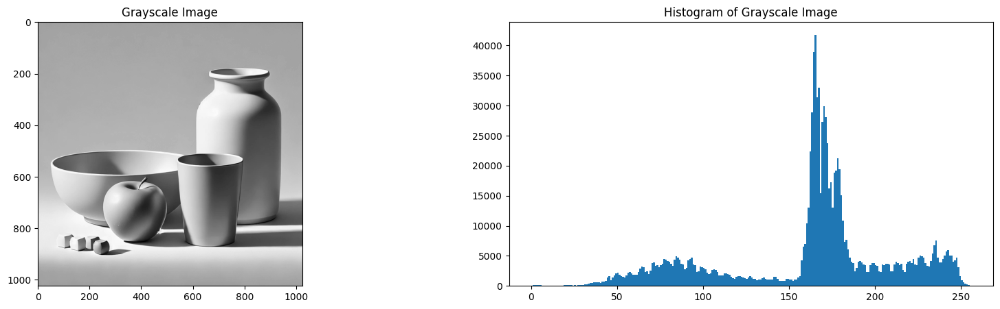

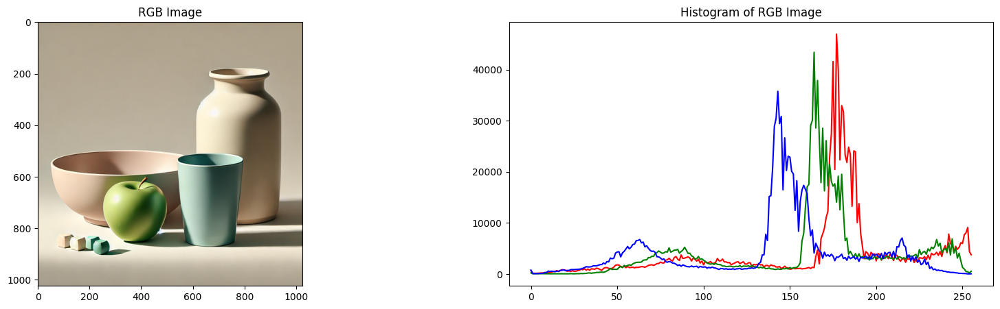

In [124]:
# Plot the histogram of the grayscale image
plt.figure(figsize=(20, 5))

plt.subplot(121)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(122)
plt.hist(img_gray.ravel(), 256, [0, 256])
plt.title('Histogram of Grayscale Image')

plt.show()

# Plot the histogram of the RGB image (for each channel)
colors = ('r', 'g', 'b')
plt.figure(figsize=(20, 5))

plt.subplot(121)
plt.imshow(img_rgb)
plt.title('RGB Image')

plt.subplot(122)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.show()

### 8. Histogram Equalization (contrast enchancing)

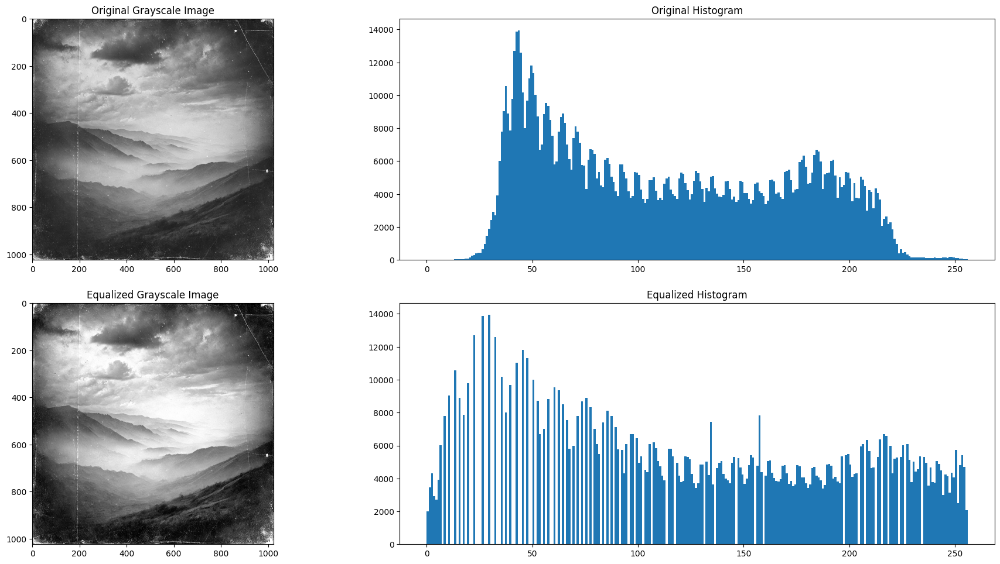

In [130]:
img_gray = cv2.cvtColor(cv2.imread('old_picture_1.webp'), cv2.COLOR_BGR2GRAY)

equalized_img = cv2.equalizeHist(img_gray)

# Plot the original and equalized images with their histograms
plt.figure(figsize=(20, 10))

plt.subplot(221)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Grayscale Image')

plt.subplot(222)
plt.hist(img_gray.ravel(), 256, [0, 256])
plt.title('Original Histogram')

plt.subplot(223)
plt.imshow(equalized_img, cmap='gray')
plt.title('Equalized Grayscale Image')

plt.subplot(224)
plt.hist(equalized_img.ravel(), 256, [0, 256])
plt.title('Equalized Histogram')

plt.tight_layout(pad=2.0)
plt.show()

### Equalizing an RGB Image
### When equalizing an RGB image, the approach differs slightly from that of a grayscale image. Since an RGB image consists of three separate channels (Red, Green, and Blue), you cannot directly apply histogram equalization to the entire image, as it might distort the color ### relationships between the channels. Instead, you apply histogram equalization to each channel separately or convert the image to another color space like HSV or LAB, where you only equalize the intensity-related component.

### Two Approaches to Equalizing an RGB Image:
### - Equalize each channel separately (in the RGB space): This involves applying histogram equalization to each of the three channels (Red, Green, and Blue). However, this might result in color distortion because it changes the relationship between the three channels.
### - Convert to another color space (like HSV or LAB): This is generally preferred because you can equalize only the intensity (brightness) component while leaving the color information intact.

## 1. Equalizing Each Channel Separately (in RGB Space)

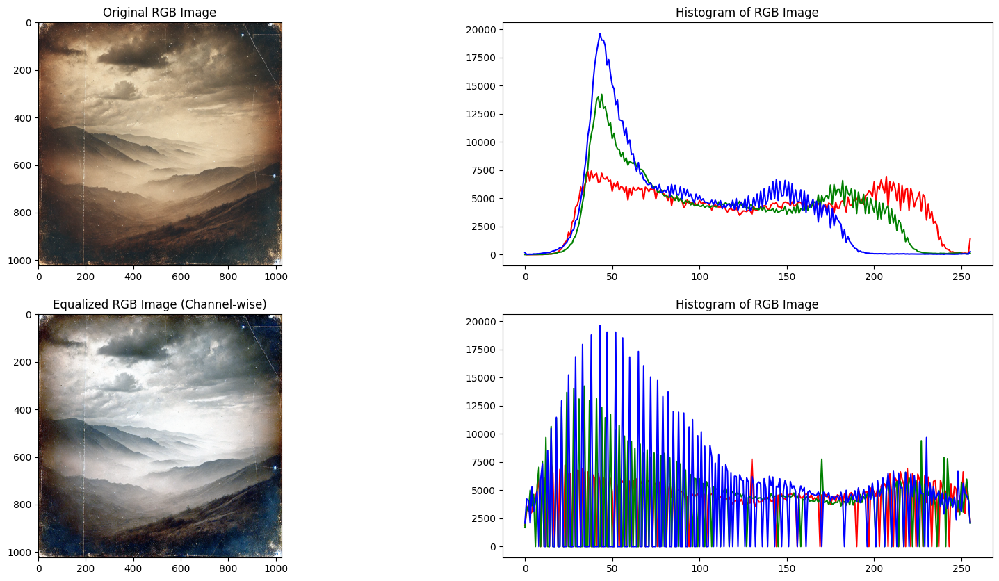

In [138]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an RGB image
img_rgb = cv2.imread('old_picture_1.webp')
img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)

# Split the RGB channels
r, g, b = cv2.split(img_rgb)

# Apply histogram equalization to each channel
r_equalized = cv2.equalizeHist(r)
g_equalized = cv2.equalizeHist(g)
b_equalized = cv2.equalizeHist(b)

# Merge the equalized channels back into an RGB image
img_rgb_equalized = cv2.merge((r_equalized, g_equalized, b_equalized))

# Plot the original and equalized images
plt.figure(figsize=(20, 10))

plt.subplot(221)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(222)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.subplot(223)
plt.imshow(img_rgb_equalized)
plt.title("Equalized RGB Image (Channel-wise)")

plt.subplot(224)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb_equalized], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.show()

### 2. Equalizing in the HSV or LAB Color Space (Preferred)
### In this method, you convert the RGB image to another color space, equalize the intensity component (like V in HSV or L in LAB), and then convert the image back to RGB.

### - HSV: Equalizing the Value (V) component, which controls brightness.
### - LAB: Equalizing the Lightness (L) component, which separates brightness from color.

### Example: Equalizing in the HSV Color Space

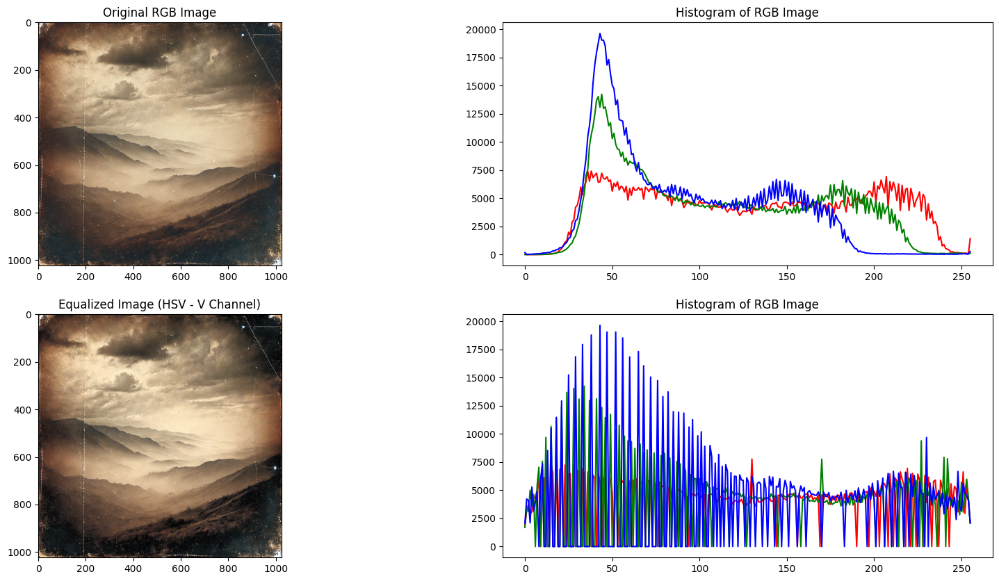

In [141]:
# Convert the RGB image to HSV color space
img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

# Split the HSV channels
h, s, v = cv2.split(img_hsv)

# Equalize the V (Value) channel
v_equalized = cv2.equalizeHist(v)

# Merge the HSV channels with the equalized V channel
img_hsv_equalized = cv2.merge((h, s, v_equalized))

# Convert the equalized HSV image back to RGB
img_rgb_equalized_hsv = cv2.cvtColor(img_hsv_equalized, cv2.COLOR_HSV2RGB)

# Plot the original and equalized images
plt.figure(figsize=(20, 10))

plt.subplot(221)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(222)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.subplot(223)
plt.imshow(img_rgb_equalized_hsv)
plt.title("Equalized Image (HSV - V Channel)")

plt.subplot(224)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb_equalized], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.show()

### Example: Equalizing in the LAB Color Space

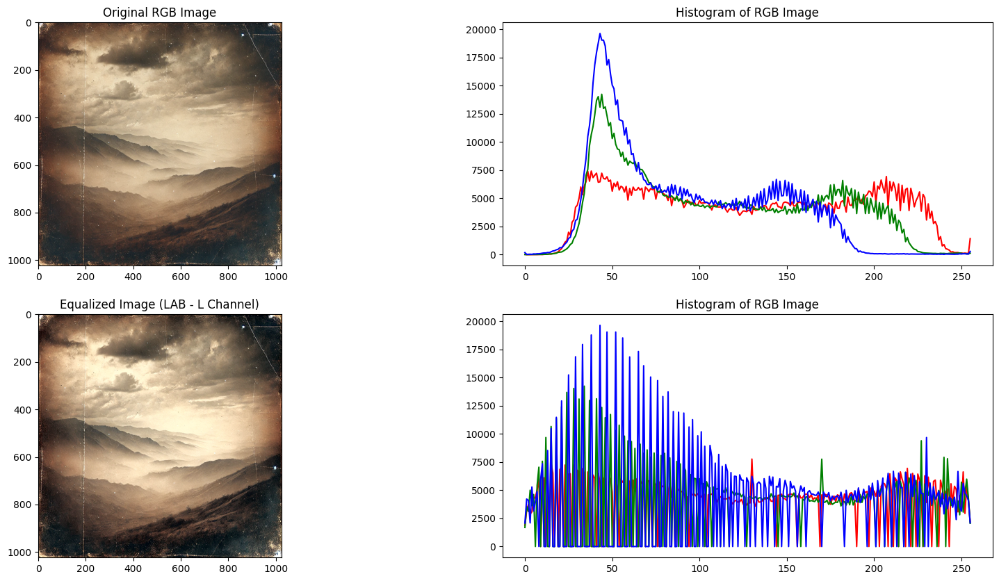

In [143]:
# Convert the RGB image to LAB color space
img_lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)

# Split the LAB channels
l, a, b = cv2.split(img_lab)

# Equalize the L (Lightness) channel
l_equalized = cv2.equalizeHist(l)

# Merge the LAB channels with the equalized L channel
img_lab_equalized = cv2.merge((l_equalized, a, b))

# Convert the equalized LAB image back to RGB
img_rgb_equalized_lab = cv2.cvtColor(img_lab_equalized, cv2.COLOR_LAB2RGB)

# Plot the original and equalized images
plt.figure(figsize=(20, 10))

plt.subplot(221)
plt.imshow(img_rgb)
plt.title("Original RGB Image")

plt.subplot(222)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.subplot(223)
plt.imshow(img_rgb_equalized_lab)
plt.title("Equalized Image (LAB - L Channel)")

plt.subplot(224)
for i, color in enumerate(colors):
    hist = cv2.calcHist([img_rgb_equalized], [i], None, [256], [0, 256])
    plt.plot(hist, color=color)
plt.title('Histogram of RGB Image')

plt.show()

### 9. Histogram matching, or specification, adjusts the histogram of one image so that it matches the histogram of another reference image. 
### It's useful for standardizing the appearance of multiple images or matching the look of one image to another.

### Steps:
### - Compute the Histogram of Both Images: Calculate the histograms for both the source and reference images.
### - Compute the CDF for Both Images: Find the cumulative distribution function for both histograms.
### - Map the Source Image to Match the Reference: Use the CDFs to map the intensity values from the source image to the reference image.
### - Apply the Mapping: Adjust the pixel values in the source image to match the histogram of the reference.

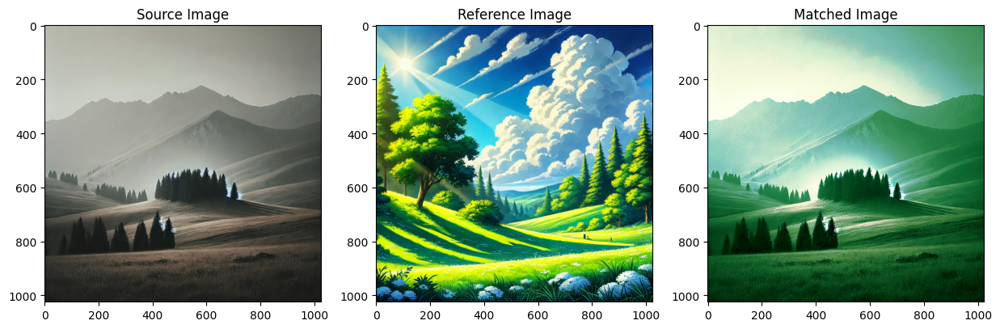

In [158]:
# Histogram Matching (Specification)
def histogram_matching_grayscale(source, reference):
    oldshape = source.shape
    source = source.ravel()
    reference = reference.ravel()

    # Get the unique pixel values and their corresponding counts in both images
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True, return_counts=True)
    r_values, r_counts = np.unique(reference, return_counts=True)

    # Compute the CDF for both images
    s_quantiles = np.cumsum(s_counts).astype(np.float64) / np.sum(s_counts)
    r_quantiles = np.cumsum(r_counts).astype(np.float64) / np.sum(r_counts)

    # Create a mapping from the source to reference using the CDFs
    interp_r_values = np.interp(s_quantiles, r_quantiles, r_values)

    return interp_r_values[bin_idx].reshape(oldshape)


def histogram_match_rgb(source_rgb, reference_rgb):
    source_r, source_g, source_b = cv2.split(source_rgb)
    reference_r, reference_g, reference_b = cv2.split(reference_rgb)

    matched_r = histogram_matching_grayscale(source_r, reference_r)
    matched_g = histogram_matching_grayscale(source_g, reference_g)
    matched_b = histogram_matching_grayscale(source_b, reference_b)

    matched_img = cv2.merge((matched_r, matched_g, matched_b))

    return matched_img.astype(np.uint8)


city1_img = cv2.imread('green_landscape.webp')
city1_img = cv2.cvtColor(city1_img, cv2.COLOR_BGR2RGB)
city2_img = cv2.imread('muted_landscape.webp')
city2_img = cv2.cvtColor(city2_img, cv2.COLOR_BGR2RGB)

img_reference = city1_img
img_source = city2_img
matched_img = histogram_match_rgb(img_source, img_reference)

# Plot the source, reference, and matched images
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(img_source)
plt.title('Source Image')

plt.subplot(132)
plt.imshow(img_reference)
plt.title('Reference Image')

plt.subplot(133)
plt.imshow(matched_img)
plt.title('Matched Image')

plt.show()